In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import segyio

from scipy.signal import butter, lfilter, filtfilt, freqz, medfilt, fftconvolve
from scipy.sparse import csr_matrix, vstack
from scipy.signal import filtfilt
from scipy.linalg import lstsq, solve
from scipy.sparse.linalg import LinearOperator, cg, lsqr
from scipy import misc
from scipy.signal import find_peaks
from scipy.signal import convolve
from scipy.linalg import toeplitz

from segyshot import SegyShot

In [3]:
inputfile = '../data/ST10010_1150780_40203_2dline1.sgy'
velfile = '../data/ST10010ZC11-MIG-VEL.MIG_VEL.VELOCITY.3D.JS-017527.segy'
f = segyio.open(inputfile, ignore_geometry=True)

In [4]:
# EBCDIC header containing textual information of the data
print(segyio.tools.wrap(f.text[0]))

C 1 CLIENT: STATOIL           COMPANY: RESERVOIR EXPLORATION TECHNOLOGY
C 2 AREA: VOLVE NORWAY BLOCK 15/9                SURVEY: ST10010
C 3 SWATH:  11                             VESSELS:M/V VIKLAND, M/V SANCO
SPIRITC 4 RCV LINE: 1150780    RCVR RANGE: 1239-1717
C 5 DATA-SET: NAV MERGE   TRACES PER RECORD: 240 X 4   SEQ: 094-133
C 6 RECORDING FORMAT: IEEE SEG-Y           FORMAT THIS REEL: SEG-Y 3592
C 7 SAMPLE CODE: FLOATING PT               PROCESSED: 03/11/2010
C 8 ACQ. GEOM: 8 ROLL 8  INLINE SWATH      LINE PREFIX: ST10010
C 9 INSTRUMENT: VECTORSEIS OCEAN BOTTOM    RECORDING SYSTEM DELAY: 0 MS
C10 RECORDING FILTER: 1.5/6-187/260MIN PHS DESCRIPTION: HZ/DB PER OCTAVE
C11 NO OF RECEIVER LINES/SWATH: 8          RECEIVER LINE SEPARATION: 400/200M
C12 ACTIVE CABLE LENGTH: 5975M             RCVRS / RCV LINE 240 X 4
C13 NO OF SOURCES:  2                      SOURCE SEPARATION: 50M
C14 RECEIVER INTERVAL: 25M                 SHOT INTERVAL: 25M, FLIP/FLOP
C15 DATUM: ED50, 31N  SPHEROID: INT. 

In [5]:
# Binary header, getting thebinary header
print(f.bin)
print('JobID from binary header: ', f.bin[segyio.BinField.JobID])

{JobID: 10010, LineNumber: 0, ReelNumber: 0, Traces: 960, AuxTraces: 0, Interval: 2000, IntervalOriginal: 2000, Samples: 2000, SamplesOriginal: 5000, Format: 5, EnsembleFold: 0, SortingCode: 1, VerticalSum: 1, SweepFrequencyStart: 0, SweepFrequencyEnd: 0, SweepLength: 0, Sweep: 0, SweepChannel: 0, SweepTaperStart: 0, SweepTaperEnd: 0, Taper: 0, CorrelatedTraces: 0, BinaryGainRecovery: 0, AmplitudeRecovery: 1, MeasurementSystem: 1, ImpulseSignalPolarity: 1, VibratoryPolarity: 0, ExtAuxTraces: 0, ExtSamples: 0, ExtSamplesOriginal: 0, ExtEnsembleFold: 0, SEGYRevision: 0, SEGYRevisionMinor: 0, TraceFlag: 0, ExtendedHeaders: 0}
JobID from binary header:  10010


In [6]:
# Trace header, extracting the trace header
print('First trace header', f.header[0]) #0 means header for the first trace
print('GroupX from first trace header', f.header[0][segyio.TraceField.GroupX])

First trace header {TRACE_SEQUENCE_LINE: 4761601, TRACE_SEQUENCE_FILE: 192001, FieldRecord: 1618, TraceNumber: 1, EnergySourcePoint: 1618, CDP: 10395429, CDP_TRACE: 0, TraceIdentificationCode: 1, NSummedTraces: 0, NStackedTraces: 0, DataUse: 1, offset: 4740, ReceiverGroupElevation: -1010, SourceSurfaceElevation: 1, SourceDepth: 63, ReceiverDatumElevation: 0, SourceDatumElevation: 0, SourceWaterDepth: 881, GroupWaterDepth: 1010, ElevationScalar: -10, SourceGroupScalar: -10, SourceX: 4357826, SourceY: 64765477, GroupX: 4311640, GroupY: 64776128, CoordinateUnits: 1, WeatheringVelocity: 0, SubWeatheringVelocity: 0, SourceUpholeTime: 0, GroupUpholeTime: 0, SourceStaticCorrection: 0, GroupStaticCorrection: 0, TotalStaticApplied: 0, LagTimeA: 0, LagTimeB: 0, DelayRecordingTime: 0, MuteTimeStart: 0, MuteTimeEND: 0, TRACE_SAMPLE_COUNT: 5000, TRACE_SAMPLE_INTERVAL: 2000, GainType: 1, InstrumentGainConstant: 6, InstrumentInitialGain: 0, Correlated: 0, SweepFrequencyStart: 0, SweepFrequencyEnd: 0,

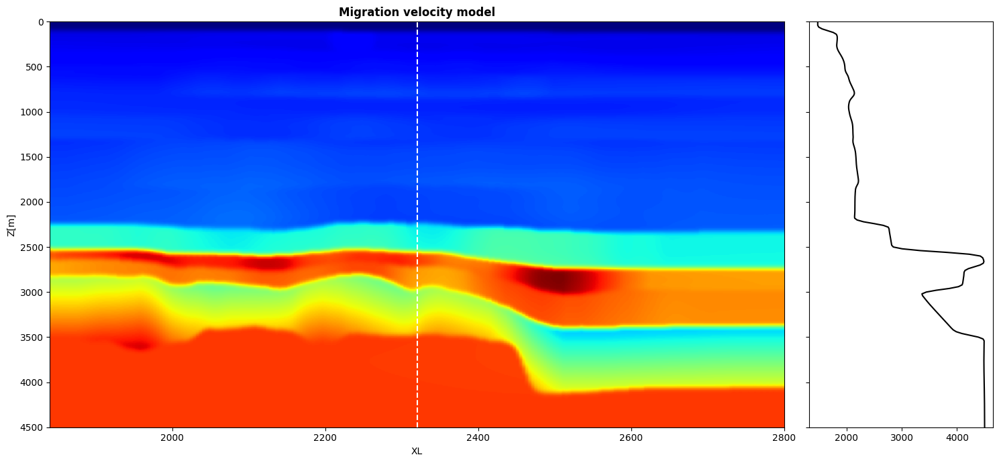

In [7]:
fv = segyio.open(velfile)
# Depth axes
z = fv.samples
il, xl = fv.ilines, fv.xlines
# Velocity model
vmod = segyio.cube(velfile)
#plotting
fig, axs = plt.subplots(1, 2, figsize=(15, 7), sharey=True, gridspec_kw={'width_ratios': [4, 1]})
axs[0].imshow(vmod[50].T, extent=(xl[0], xl[-1], z[-1], z[0]), cmap='jet')
axs[0].axvline(xl[120], color='w', linestyle='--')
axs[0].set_title('Migration velocity model', fontweight='bold')
axs[0].set_xlabel('XL')
axs[0].set_ylabel('Z[m]')
axs[0].axis('tight')
axs[1].plot(vmod[50, 120], z, 'k')
plt.tight_layout();

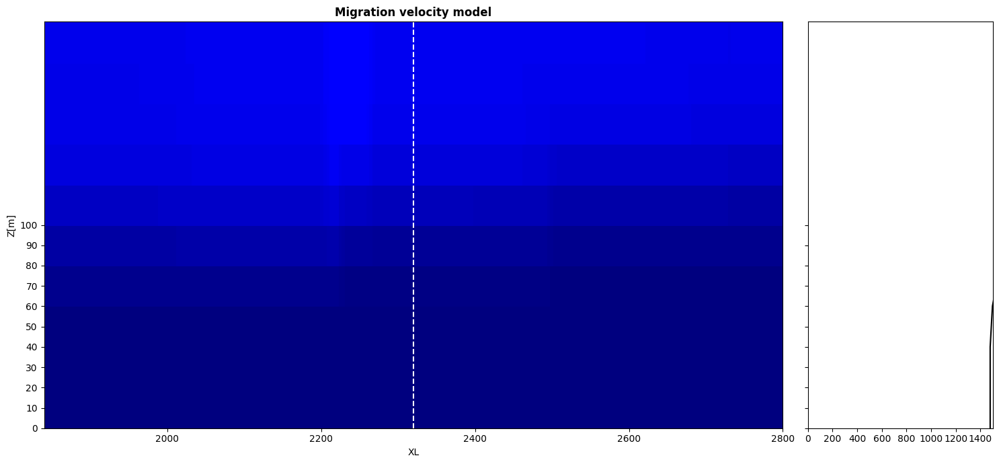

In [8]:
# Depth axes
z = fv.samples
il, xl = fv.ilines, fv.xlines
# Velocity model
vmod = segyio.cube(velfile)
#plotting
fig, axs = plt.subplots(1, 2, figsize=(15, 7), sharey=True, gridspec_kw={'width_ratios': [4, 1]})
axs[0].imshow(vmod[50].T, extent=(xl[0], xl[-1], z[-1], z[0]), cmap='jet')
axs[0].axvline(xl[120], color='w', linestyle='--')
axs[0].set_title('Migration velocity model', fontweight='bold')
axs[0].set_xlabel('XL')
axs[0].set_ylabel('Z[m]')
axs[0].axis('tight')
#limiting the y-axis for the migration velocity model
axs[0].set_ylim(0, 100)
axs[1].plot(vmod[50, 120], z, 'k')
#limting the axes for the velocity profile
axs[1].set_xlim(0, 1500)
axs[1].set_xticks(range(0, 1501, 200))
axs[1].set_ylim(0, 200)

axs[0].set_yticks(range(0, 101, 10))
axs[1].set_yticks(range(0, 101, 10))

plt.tight_layout()
plt.show()

In [9]:
#water layer thickness is approximately 90m and velocity of this layer is 1500m/s

In [10]:
#loading our pressure traces and choosing a single trace
pressure_traces = segyio.collect(f.trace[:240*4])[::4];
tr = pressure_traces[11]
tr.shape
#consistent with the 2000 samlpes per trace

(2000,)

In [11]:
#part 1, Predictive deconvolution and its basics

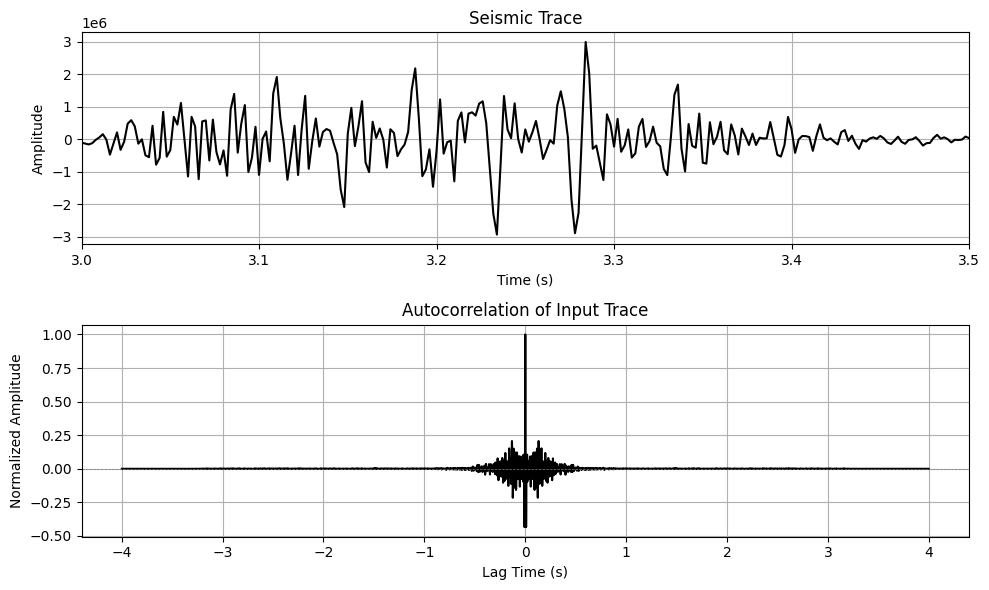

In [12]:
sampling_interval = 0.002  #2 ms, found in the header information C17
time = np.arange(0, len(tr) * sampling_interval, sampling_interval) #time axis for the trace

#Calculating autocorrelation
autocorr = np.correlate(tr, tr, mode='full')
lags = np.arange(-len(tr) + 1, len(tr))
lags_time = lags * sampling_interval  #converting lags to time units
autocorr = autocorr / np.max(autocorr) #normalizing the autocorrelation

#plotting the trace and its autocorrelation
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(time, tr, color='black', linewidth=1.5)
plt.title('Seismic Trace')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.xlim(3, 3.5) #For better visualization
plt.grid()

plt.subplot(2, 1, 2)
plt.plot(lags_time, autocorr, color='black', linewidth=1.5)
plt.title('Autocorrelation of Input Trace')
plt.xlabel('Lag Time (s)')
plt.ylabel('Normalized Amplitude')
plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)
plt.grid()

plt.tight_layout()
plt.show()

The lag value of the second zero crossing is: 0.0100 seconds


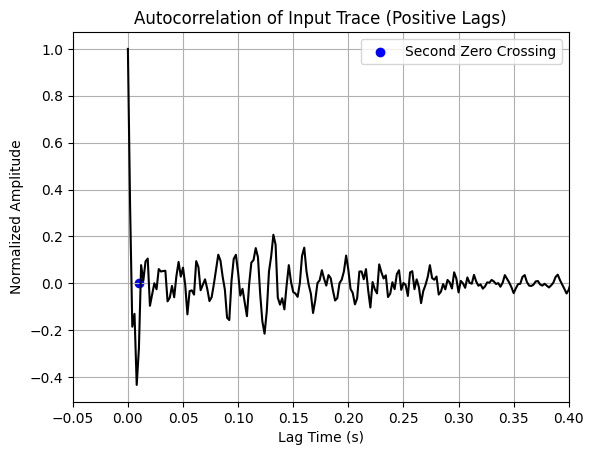

In [13]:
#extracting only positive lags from the trace autocorrelation
positive_lags = lags_time[lags_time >= 0]
positive_autocorr = autocorr[lags_time >= 0]

#finding where the autocorrelation crosses zero.
#alpha shoudl be roughly set to be equal to the second zero crossing of the autocorrelation function
zero_crossings = np.where(np.diff(np.sign(positive_autocorr)))[0]

#getting the x-value of the second zero crossing
second_zero_crossing_index = zero_crossings[1]
second_zero_crossing_lag = positive_lags[second_zero_crossing_index]
print(f"The lag value of the second zero crossing is: {second_zero_crossing_lag:.4f} seconds")

#plotting the positive-lag autocorrelation
plt.plot(positive_lags, positive_autocorr, color='black', linewidth=1.5)

#marking the second zero crossing for good visualization
if len(zero_crossings) > 1:
    plt.scatter(second_zero_crossing_lag, 0, color='blue', label='Second Zero Crossing')

plt.title('Autocorrelation of Input Trace (Positive Lags)')
plt.xlabel('Lag Time (s)')
plt.ylabel('Normalized Amplitude')
plt.xlim(-0.05, 0.4)
plt.grid()
plt.legend()
plt.show()

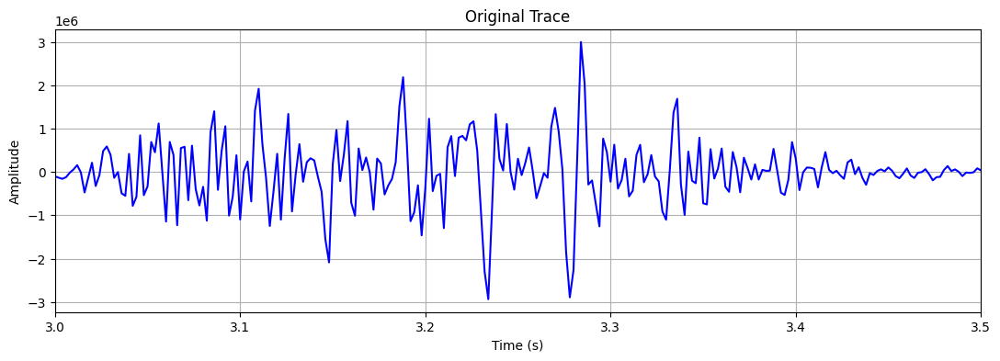

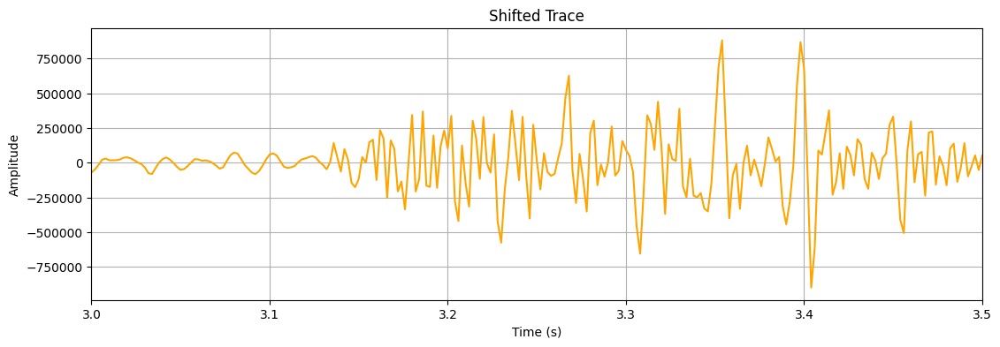

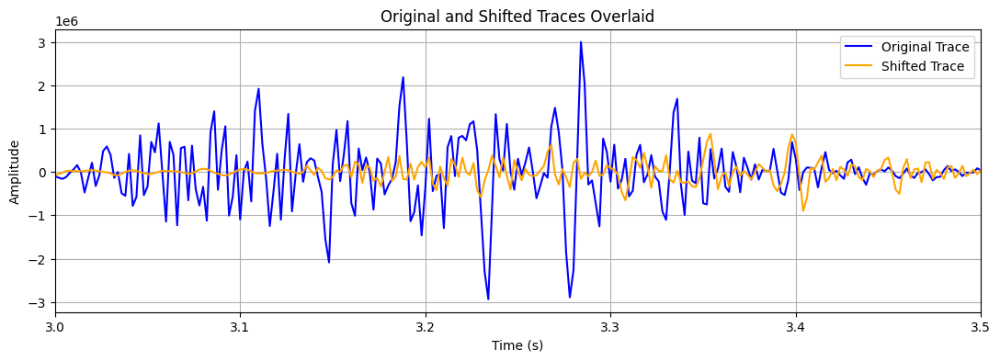

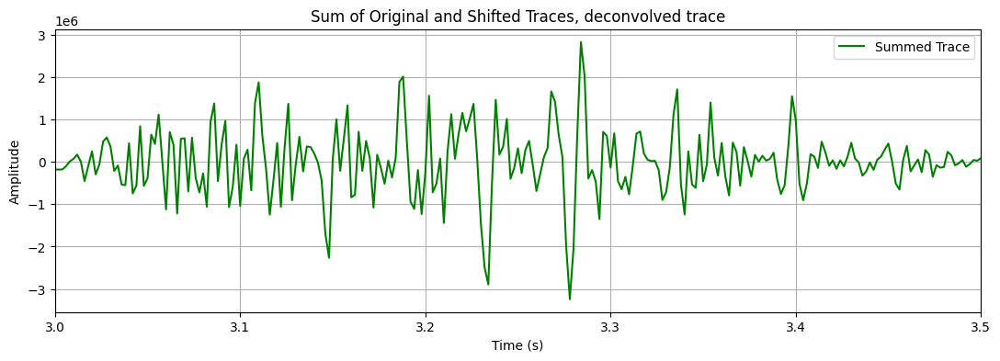

In [14]:
#in this part, I'm accounting for the water layer reverberations and i'm taking the delay time to be 0.12s ((2*90)/1500)
delay_samples = int(0.12/ sampling_interval)

#creating a shifted version of the trace
r1 = -0.3#scaling factor
shifted_tr = np.zeros_like(tr)
shifted_tr[delay_samples:] = tr[:-delay_samples] * r1

summed_trace = tr + shifted_tr

#time axis for the trace
time = np.arange(0, len(tr) * sampling_interval, sampling_interval)

#plotting the original trace
plt.figure(figsize=(13, 4))
plt.plot(time, tr, label='Original Trace', linewidth=1.5, color='blue')
plt.title('Original Trace')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.xlim(3, 3.5)
plt.grid()
plt.show()

#plotting the shifted trace
plt.figure(figsize=(13, 4))
plt.plot(time, shifted_tr, label='Shifted Trace', linewidth=1.5, color='orange')
plt.title('Shifted Trace')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.xlim(3, 3.5)
plt.grid()
plt.show()

#plotting both traces overlaid
plt.figure(figsize=(13, 4))
plt.plot(time, tr, label='Original Trace', linewidth=1.5, color='blue')
plt.plot(time, shifted_tr, label='Shifted Trace', linewidth=1.5, color='orange')
plt.title('Original and Shifted Traces Overlaid')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.xlim(3, 3.5)
plt.grid()
plt.show()

#plotting the sum of the original and shifted traces, so that the repetitive character in the trace cancels
plt.figure(figsize=(13, 4))
plt.plot(time, summed_trace, label='Summed Trace', linewidth=1.5, color='green')
plt.title('Sum of Original and Shifted Traces, deconvolved trace')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.xlim(3, 3.5)
plt.grid()
plt.show()

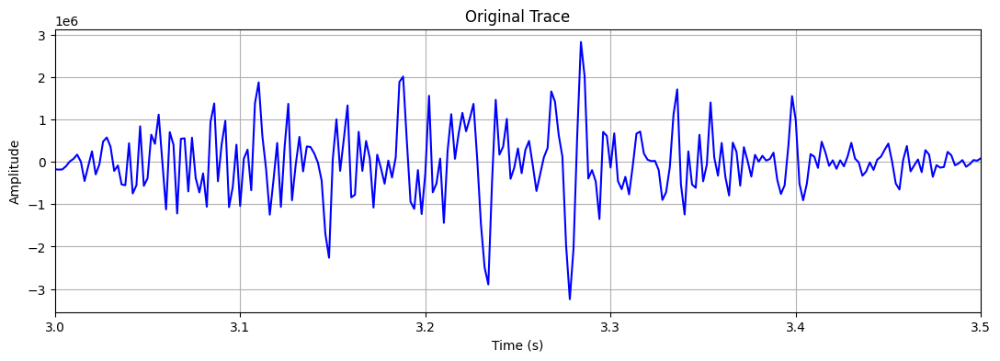

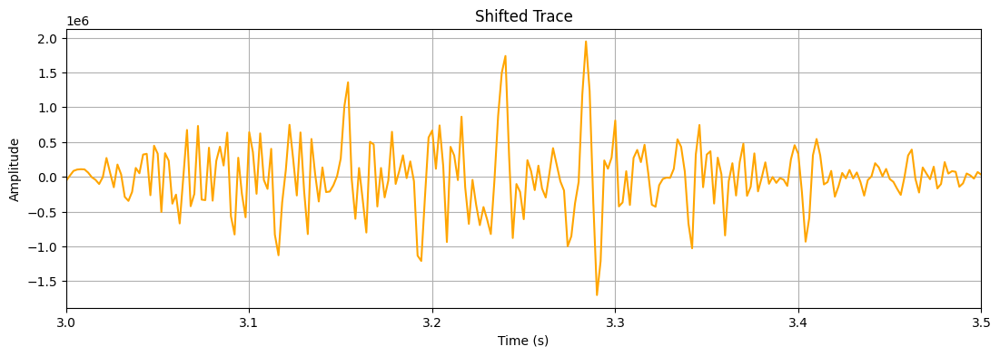

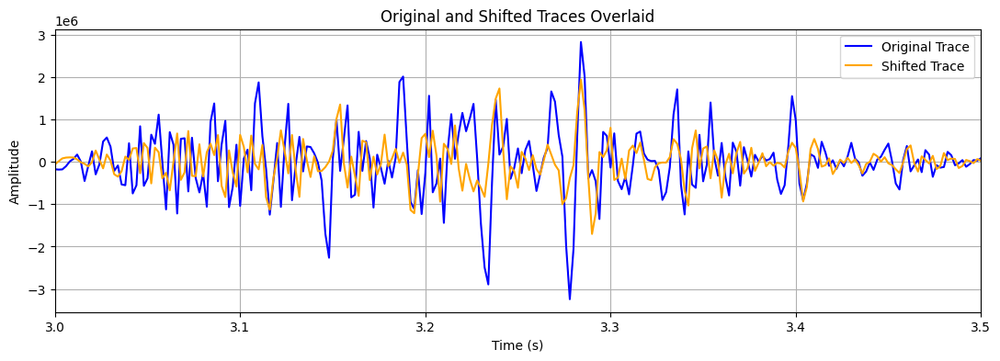

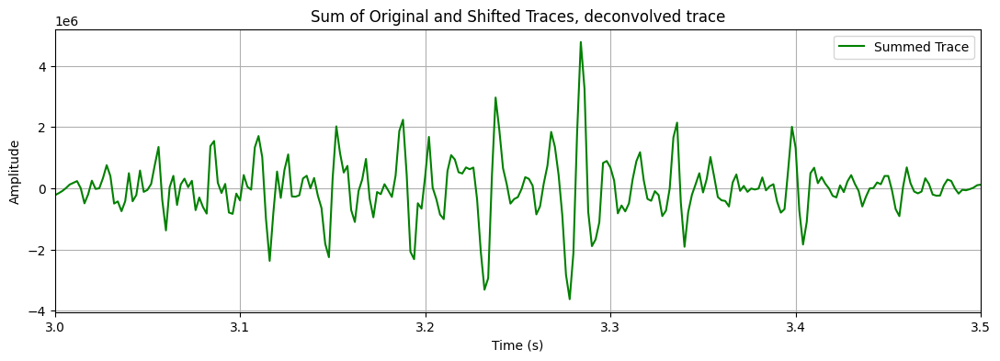

In [15]:
#shifting the trace using the second zero corssing as alpha
#the second alpha crossing has a value of 0.01s however considering a small margin of error the value 0.006 showed a best result. this shows that the second-zero
#crossing method used is not very reliable sometimes.
delay_samples = int(0.006/ sampling_interval)

#creating a shifted version of the trace
r1 = -0.6#scaling factor
tr=summed_trace;
shifted_tr = np.zeros_like(tr)
shifted_tr[delay_samples:] = tr[:-delay_samples] * r1

summed_trace2 = tr + shifted_tr

#time axis for the trace
time = np.arange(0, len(tr) * sampling_interval, sampling_interval)

#plotting the original trace
plt.figure(figsize=(13, 4))
plt.plot(time, tr, label='Original Trace', linewidth=1.5, color='blue')
plt.title('Original Trace')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.xlim(3, 3.5)
plt.grid()
plt.show()

#plotting the shifted trace
plt.figure(figsize=(13, 4))
plt.plot(time, shifted_tr, label='Shifted Trace', linewidth=1.5, color='orange')
plt.title('Shifted Trace')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.xlim(3, 3.5)
plt.grid()
plt.show()

#plotting both traces overlaid
plt.figure(figsize=(13, 4))
plt.plot(time, tr, label='Original Trace', linewidth=1.5, color='blue')
plt.plot(time, shifted_tr, label='Shifted Trace', linewidth=1.5, color='orange')
plt.title('Original and Shifted Traces Overlaid')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.xlim(3, 3.5)
plt.grid()
plt.show()

#plotting the sum of the original and shifted traces, so that the repetitive character in the trace cancels
plt.figure(figsize=(13, 4))
plt.plot(time, summed_trace2, label='Summed Trace', linewidth=1.5, color='green')
plt.title('Sum of Original and Shifted Traces, deconvolved trace')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.xlim(3, 3.5)
plt.grid()
plt.show()

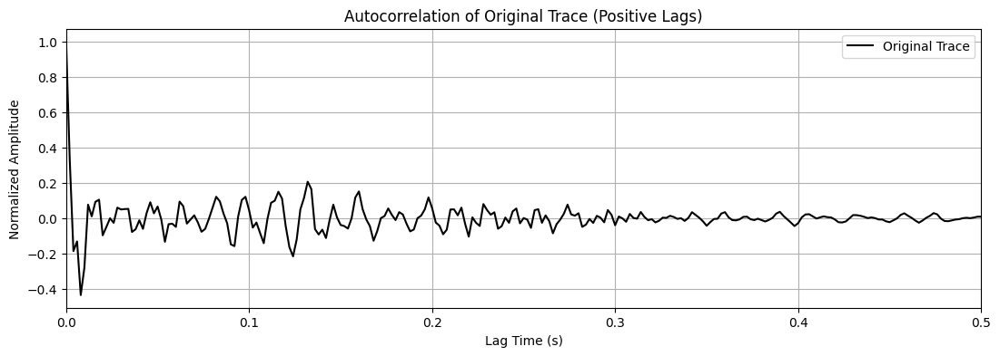

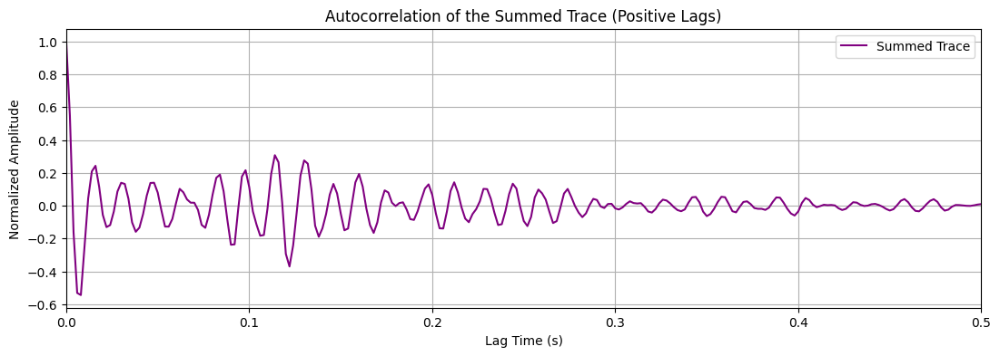

In [16]:
# Plot the positive-lag autocorrelation of the original trace
plt.figure(figsize=(13, 4))
plt.plot(positive_lags, positive_autocorr, color='black', linewidth=1.5, label='Original Trace')
plt.title('Autocorrelation of Original Trace (Positive Lags)')
plt.xlabel('Lag Time (s)')
plt.ylabel('Normalized Amplitude')
plt.xlim(0, 0.5)
plt.grid()
plt.legend()
plt.show()

#calculating the autocorrelation of the summed trace and plotting it
autocorr_summed = np.correlate(summed_trace2, summed_trace2, mode='full')
lags = np.arange(-len(summed_trace2) + 1, len(summed_trace2))
lags_time = lags * sampling_interval
autocorr_summed = autocorr_summed / np.max(np.abs(autocorr_summed))
positive_lags_summed = lags_time[lags_time >= 0]
positive_autocorr_summed = autocorr_summed[lags_time >= 0]

plt.figure(figsize=(13, 4))
plt.plot(positive_lags_summed, positive_autocorr_summed, linewidth=1.5, color='purple', label='Summed Trace')
plt.title('Autocorrelation of the Summed Trace (Positive Lags)')
plt.xlabel('Lag Time (s)')
plt.ylabel('Normalized Amplitude')
plt.grid()
plt.xlim(0, 0.5)
plt.legend()
plt.show()

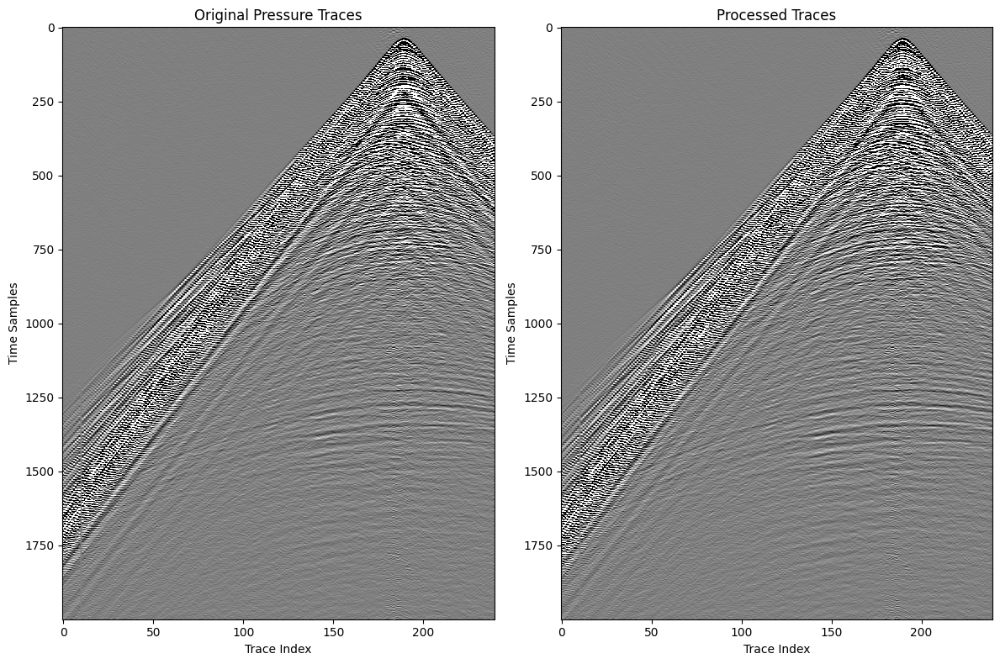

In [17]:
#doing step 1 to remove the water layer reverberations over all the traces
processed_traces = np.zeros_like(pressure_traces)  #to store the processed traces

#looping over all the  traces and running all the steps we did before
for trace_index, tr in enumerate(pressure_traces):
    time = np.arange(0, len(tr) * sampling_interval, sampling_interval)

    #calculating autocorrelation for the trace
    autocorr = np.correlate(tr, tr, mode='full')
    lags = np.arange(-len(tr) + 1, len(tr))
    lags_time = lags * sampling_interval
    autocorr = autocorr / np.max(np.abs(autocorr))

    # extracting the positive lags
    positive_lags = lags_time[lags_time >= 0]
    positive_autocorr = autocorr[lags_time >= 0]

    #finding alpha
    alpha=0.12;
    #calculating the shifted scaled trace
    delay_samples = int(alpha / sampling_interval)
    r1 = -0.3
    shifted_tr = np.zeros_like(tr)
    shifted_tr[delay_samples:] = tr[:-delay_samples] * r1
    summed_trace = tr + shifted_tr
    processed_traces[trace_index] = summed_trace

plt.figure(figsize=(12, 8))

#plotting the original pressure traces
plt.subplot(1, 2, 1)
plt.imshow(pressure_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Original Pressure Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

#plotting the processed traces
plt.subplot(1, 2, 2)
plt.imshow(processed_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Processed Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

plt.tight_layout()
plt.show()

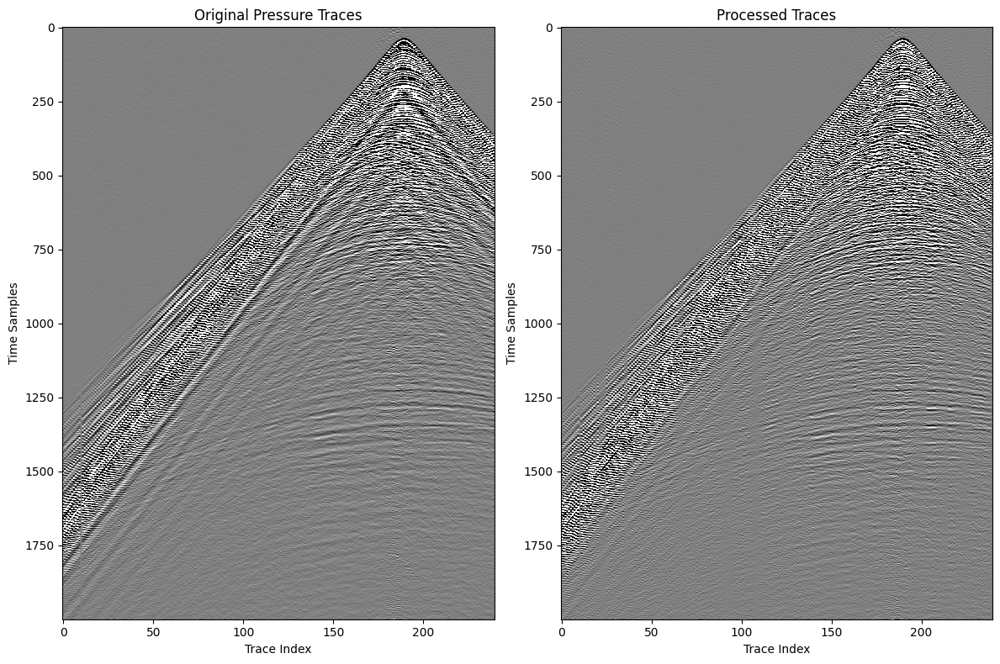

In [18]:
#step 2, removing the airgun bubble effects, looping over all the traces
processed_traces2 = np.zeros_like(processed_traces)  #to store the processed traces

#looping over all the  traces and running all the steps we did before
for trace_index, tr in enumerate(processed_traces):
    time = np.arange(0, len(tr) * sampling_interval, sampling_interval)

    #calculating autocorrelation for the trace
    autocorr = np.correlate(tr, tr, mode='full')
    lags = np.arange(-len(tr) + 1, len(tr))
    lags_time = lags * sampling_interval
    autocorr = autocorr / np.max(np.abs(autocorr))

    #extracting the positive lags
    positive_lags = lags_time[lags_time >= 0]
    positive_autocorr = autocorr[lags_time >= 0]

    #finding alpha
    zero_crossings = np.where(np.diff(np.sign(positive_autocorr)))[0]
    second_zero_crossing_index = zero_crossings[1]
    second_zero_crossing_lag = positive_lags[second_zero_crossing_index]-0.002 #yielded slightly better resuts when I accounted for a 0.002 error

    #calculating the shifted scaled trace
    delay_samples = int(second_zero_crossing_lag / sampling_interval)
    r1 = -0.6
    shifted_tr = np.zeros_like(tr)
    shifted_tr[delay_samples:] = tr[:-delay_samples] * r1
    summed_trace = tr + shifted_tr
    processed_traces2[trace_index] = summed_trace

plt.figure(figsize=(12, 8))

#plotting the original pressure traces
plt.subplot(1, 2, 1)
plt.imshow(pressure_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Original Pressure Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

#plotting the processed traces
plt.subplot(1, 2, 2)
plt.imshow(processed_traces2.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Processed Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

plt.tight_layout()
plt.show()

In [20]:
#PART 2, predictive deconvolution filter

In [21]:
pressure_traces = segyio.collect(f.trace[:240*4])[::4];
tr = pressure_traces[130]

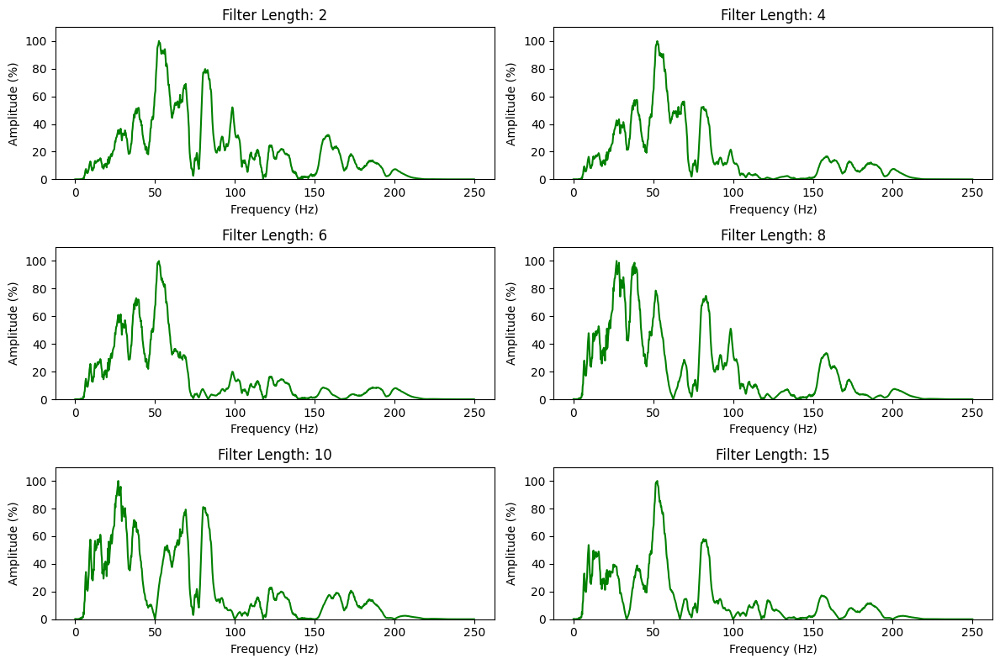

In [22]:
#defining a range of filer legnths to choose the best one
filter_lengths = [2, 4, 6, 8, 10, 15]

sampling_frequency = 1/sampling_interval  #in Hz
n_samples = len(tr)

#defining the frequency axis for plotting
frequencies = np.fft.rfftfreq(n_samples, d=1/sampling_frequency)

#function to create a smoothing filter
def create_filter(length):
    return np.ones(length) / length  #simple moving average filter

plt.figure(figsize=(12, 8))

#looping over different filter lengths
for i, filter_length in enumerate(filter_lengths):
    filt = create_filter(filter_length)

    #applying the filter to the trace using convolution
    filtered_trace = convolve(tr, filt, mode='same')

    #computing the  amplitude spectrum of the filtered trace
    spectrum = np.fft.rfft(filtered_trace)
    amplitude_spectrum = np.abs(spectrum) / np.max(np.abs(spectrum)) * 100  #normalize to percentage

    #plotting the amplitude spectrum
    plt.subplot(3, 2, i + 1)
    plt.plot(frequencies, amplitude_spectrum, color='green')
    plt.title(f"Filter Length: {filter_length}")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Amplitude (%)")
    plt.ylim(0, 110)

plt.tight_layout()
plt.show()

The lag value of the second zero crossing is: 5 (lag index)


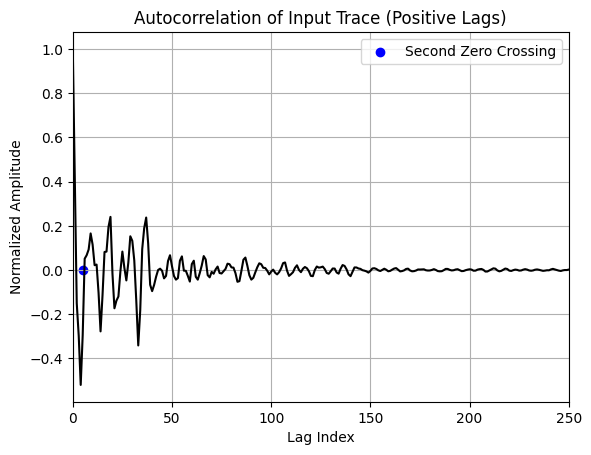

In [23]:
#calculating the autocorrelation and extracting fo the positive lags
autocorr = np.correlate(tr, tr, mode='full')
lags = np.arange(-len(tr) + 1, len(tr))
autocorr = autocorr / np.max(autocorr)
positive_lags = lags[lags >= 0]
positive_autocorr = autocorr[lags >= 0]

#finding the second zero corssing (alpha)
zero_crossings = np.where(np.diff(np.sign(positive_autocorr)))[0]
second_zero_crossing_index = zero_crossings[1]  # Second zero crossing index
second_zero_crossing_lag = positive_lags[second_zero_crossing_index]  # Lag value at second zero crossing
print(f"The lag value of the second zero crossing is: {second_zero_crossing_lag} (lag index)")

#plotting
plt.plot(positive_lags, positive_autocorr, color='black', linewidth=1.5)
plt.scatter(second_zero_crossing_lag, 0, color='blue', label='Second Zero Crossing')
plt.title('Autocorrelation of Input Trace (Positive Lags)')
plt.xlabel('Lag Index')
plt.ylabel('Normalized Amplitude')
plt.grid()
plt.legend()
plt.xlim(0, 250)
plt.show()

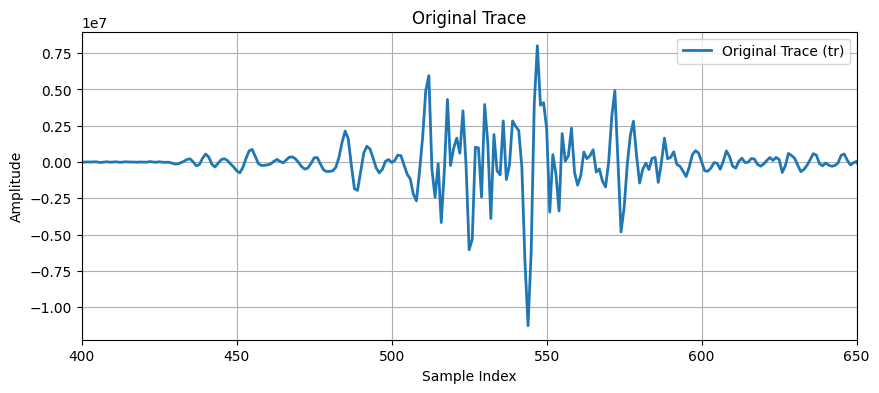

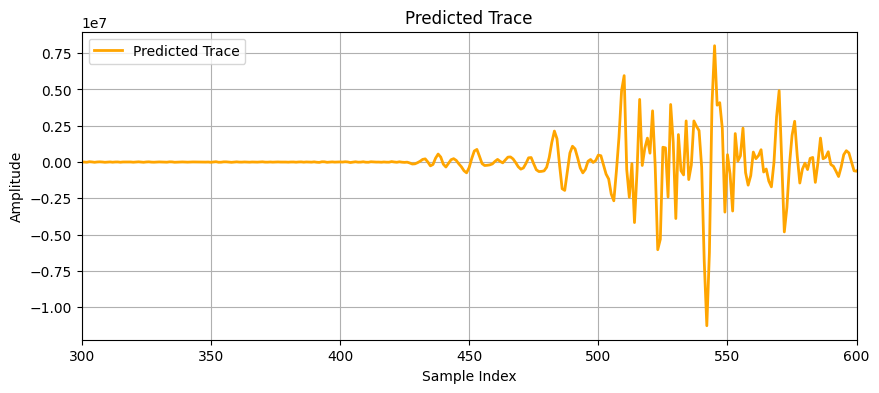

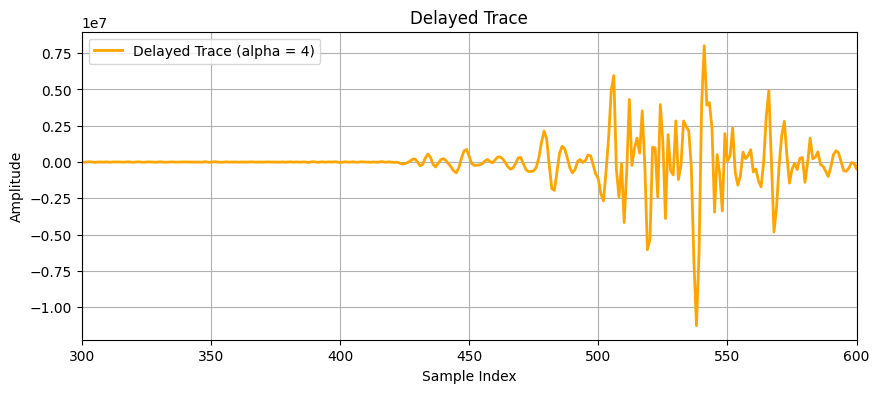

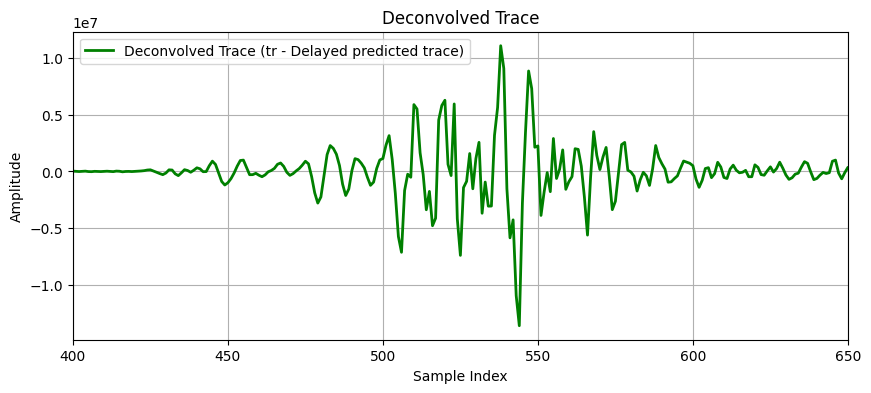

In [24]:
#extracting only the relevant part (non-negative lags)
n = len(tr)
n_filter = 6
alpha=5-1 #accounting for this uncertainty gave better results
#alpha=1
autocorr_positive = autocorr[n-1:]

#constructing the left hand topelitz matrix
autocorr_matrix = toeplitz(autocorr_positive[:n_filter])

#calculating the inverse of the autocorrelation matrix
inverse_autocorr_matrix = np.linalg.inv(autocorr_matrix)

#extracting the right hand vector
desired_vector = autocorr_matrix[0]
#desired_vector = autocorr_positive[alpha:alpha + n_filter]

#solving for the operators
operators = np.dot(inverse_autocorr_matrix, desired_vector)

#getting the predicted trace
predicted_trace = np.convolve(tr, operators, mode='same')

#delaying the predicted trace
delayed_trace = np.zeros_like(predicted_trace)
delayed_trace[:-alpha] = predicted_trace[alpha:]

#subtracting the delayed trace from the original trace
resulting_trace = tr - delayed_trace

#plotting the original trace
plt.figure(figsize=(10, 4))
plt.plot(tr, label="Original Trace (tr)", linewidth=2)
plt.title("Original Trace")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
#plt.xlim(1400, 1800)
plt.xlim(400, 650)
plt.grid()
plt.legend()
plt.show()

#plotting the predicted trace
plt.figure(figsize=(10, 4))
plt.plot(predicted_trace, label="Predicted Trace", linewidth=2, color='orange')
plt.title("Predicted Trace")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
#plt.xlim(1400, 1800)
plt.xlim(300, 600)
plt.grid()
plt.legend()
plt.show()

#plotting the delayed predicted trace
plt.figure(figsize=(10, 4))
plt.plot(delayed_trace, label=f"Delayed Trace (alpha = {alpha})", linewidth=2, color='orange')
plt.title("Delayed Trace")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
#plt.xlim(1400, 1800)
plt.xlim(300, 600)
plt.grid()
plt.legend()
plt.show()

#plotting the deconvolved trace
plt.figure(figsize=(10, 4))
plt.plot(resulting_trace, label="Deconvolved Trace (tr - Delayed predicted trace)", linewidth=2, color='green')
plt.title("Deconvolved Trace")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
#plt.xlim(1400, 1800)
plt.xlim(400, 650)
plt.grid()
plt.legend()
plt.show()

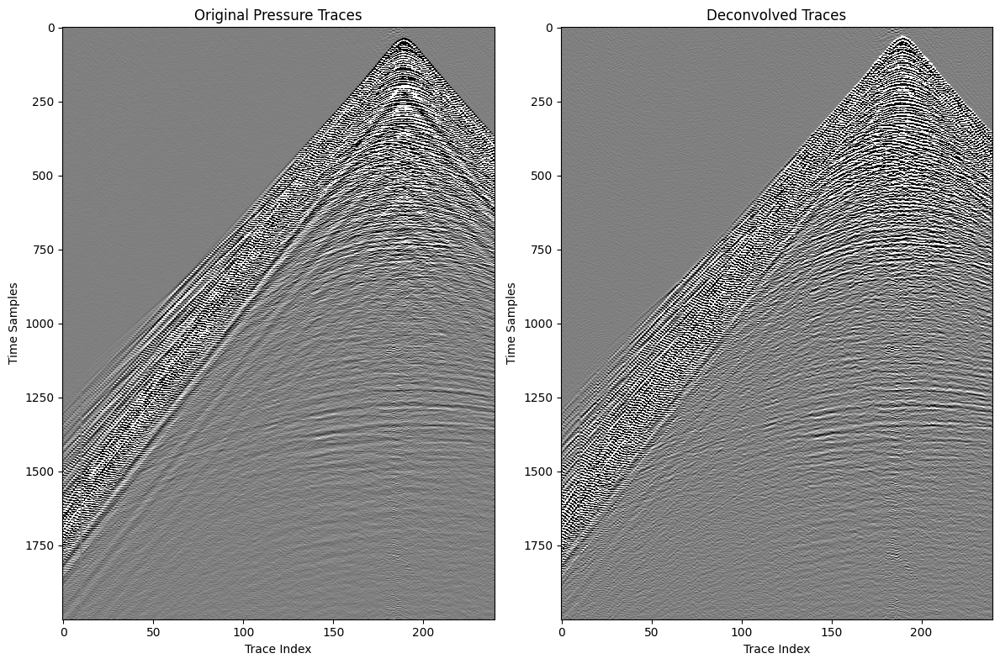

In [25]:
n_filter = 6
deconvolved_traces = np.zeros_like(pressure_traces)

#looping over each trace and performing the previous steps
for trace_index, tr in enumerate(pressure_traces):
    #calculating the autocorrelation
    autocorr = np.correlate(tr, tr, mode='full')
    lags = np.arange(-len(tr) + 1, len(tr))
    autocorr = autocorr / np.max(autocorr)
    positive_lags = lags[lags >= 0]
    positive_autocorr = autocorr[lags >= 0]

    #finding alpha
    zero_crossings = np.where(np.diff(np.sign(positive_autocorr)))[0]
    alpha = positive_lags[zero_crossings[1]]-1 #aacounting for uncertainty gave better results
    #alpha=1

    #constructing the Toeplitz matrix
    autocorr_matrix = toeplitz(positive_autocorr[:n_filter])
    inverse_autocorr_matrix = np.linalg.inv(autocorr_matrix)

    rhv = autocorr_matrix[0]
    #rhv = positive_autocorr[alpha:alpha+n_filter]
    operators = np.dot(inverse_autocorr_matrix, rhv)

    #concolving to get the predicted trace
    convolved_trace = np.convolve(tr, operators, mode='same')

    #delaying the predicted trace
    delayed_trace = np.zeros_like(convolved_trace)
    delayed_trace[:-alpha] = convolved_trace[alpha:]

    #getting the deconvolved trace
    deconvolved_trace = tr - delayed_trace
    deconvolved_traces[trace_index] = deconvolved_trace

#plotting the original and deconvolved traces
plt.figure(figsize=(12, 8))

# Plot the original pressure traces
plt.subplot(1, 2, 1)
plt.imshow(pressure_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Original Pressure Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

# Plot the processed traces
plt.subplot(1, 2, 2)
plt.imshow(deconvolved_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Deconvolved Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

# Adjust layout and display
plt.tight_layout()
plt.show()

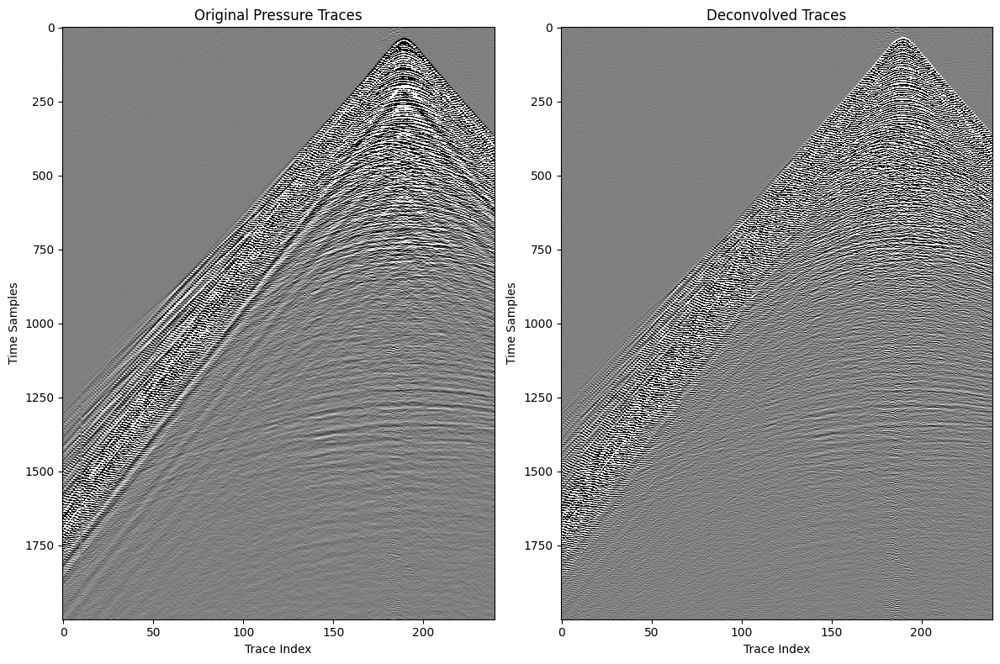

In [26]:
#taking alpha =1
n_filter = 6
deconvolved_traces = np.zeros_like(pressure_traces)

#looping over each trace and performing the previous steps
for trace_index, tr in enumerate(pressure_traces):
    #calculating the autocorrelation
    autocorr = np.correlate(tr, tr, mode='full')
    lags = np.arange(-len(tr) + 1, len(tr))
    autocorr = autocorr / np.max(autocorr)
    positive_lags = lags[lags >= 0]
    positive_autocorr = autocorr[lags >= 0]

    #finding alpha
    zero_crossings = np.where(np.diff(np.sign(positive_autocorr)))[0]
    #alpha = positive_lags[zero_crossings[1]]-1 #aacounting for uncertainty gave better results
    alpha=1

    #constructing the Toeplitz matrix
    autocorr_matrix = toeplitz(positive_autocorr[:n_filter])
    inverse_autocorr_matrix = np.linalg.inv(autocorr_matrix)

    rhv = autocorr_matrix[0]
    #rhv = positive_autocorr[alpha:alpha+n_filter]
    operators = np.dot(inverse_autocorr_matrix, rhv)

    #concolving to get the predicted trace
    convolved_trace = np.convolve(tr, operators, mode='same')

    #delaying the predicted trace
    delayed_trace = np.zeros_like(convolved_trace)
    delayed_trace[:-alpha] = convolved_trace[alpha:]

    #getting the deconvolved trace
    deconvolved_trace = tr - delayed_trace
    deconvolved_traces[trace_index] = deconvolved_trace

#plotting the original and deconvolved traces
plt.figure(figsize=(12, 8))

# Plot the original pressure traces
plt.subplot(1, 2, 1)
plt.imshow(pressure_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Original Pressure Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

# Plot the processed traces
plt.subplot(1, 2, 2)
plt.imshow(deconvolved_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Deconvolved Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

# Adjust layout and display
plt.tight_layout()
plt.show()

In [27]:
#PART 3, alternate application of the filter using "the prediction error operators"

In [28]:
pressure_traces = segyio.collect(f.trace[:240*4])[::4];
tr = pressure_traces[219]

The lag value of the second zero crossing is: 5 (lag index)


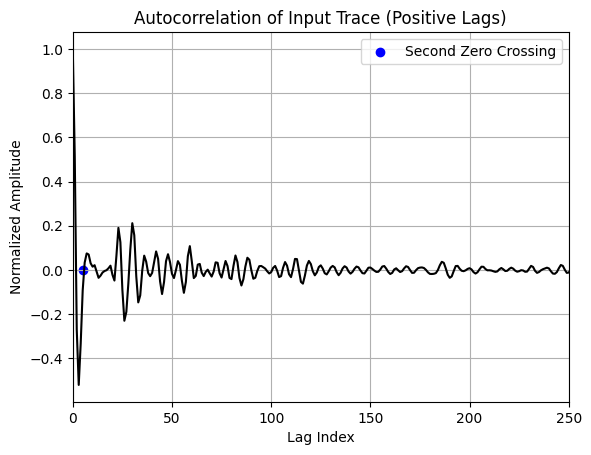

In [29]:
#calculating the autocorrelation and extracting fo the positive lags
autocorr = np.correlate(tr, tr, mode='full')
lags = np.arange(-len(tr) + 1, len(tr))
autocorr = autocorr / np.max(autocorr)
positive_lags = lags[lags >= 0]
positive_autocorr = autocorr[lags >= 0]

#finding the second zero corssing (alpha)
zero_crossings = np.where(np.diff(np.sign(positive_autocorr)))[0]
second_zero_crossing_index = zero_crossings[1]  # Second zero crossing index
second_zero_crossing_lag = positive_lags[second_zero_crossing_index]  # Lag value at second zero crossing
print(f"The lag value of the second zero crossing is: {second_zero_crossing_lag} (lag index)")

#plotting
plt.plot(positive_lags, positive_autocorr, color='black', linewidth=1.5)
plt.scatter(second_zero_crossing_lag, 0, color='blue', label='Second Zero Crossing')
plt.title('Autocorrelation of Input Trace (Positive Lags)')
plt.xlabel('Lag Index')
plt.ylabel('Normalized Amplitude')
plt.grid()
plt.legend()
plt.xlim(0, 250)
plt.show()

In [31]:
alpha=60; #(0.12*500)

shifted_tr = np.roll(tr, alpha)  # Shift the trace by alpha
crosscorr = np.correlate(shifted_tr, tr, mode='full')
crosscorr = crosscorr / np.max(crosscorr)
crosscorr_positive = crosscorr[len(tr) - 1:len(tr) - 1 + alpha]

rhv = np.concatenate((crosscorr_positive, np.zeros(n)))

In [32]:
#calculating the autocorrelation
autocorr = np.correlate(tr, tr, mode='full')

#extracting only the relevant part (non-negative lags)
n = len(tr)
autocorr=autocorr/np.max(autocorr)
autocorr_positive = autocorr[n-1:]

n_filter = 4

#constructing the Toeplitz matrix
autocorr_matrix = toeplitz(autocorr_positive[:n_filter+alpha])
#solving the system to get the operators
try:
    #extracting the submatrix and the right-hand side vector relevant for the size n
    autocorr_submatrix = autocorr_matrix[:n_filter, :n_filter]  #selecting only the first n rows and columns
    rhv_relevant = rhv[:n_filter]  #selecting only the first n elements of the rhv vector
    #solving for the operators
    coefficients = np.linalg.solve(autocorr_submatrix, rhv_relevant)
    #showing the results
    print("Solution (coefficients):", coefficients)

except np.linalg.LinAlgError as e:
    print("Error solving the system:", e)

Solution (coefficients): [-0.01090728  0.05040235  0.07777062 -0.08623591]


In [33]:
initial_values = [1, 0, 0, 0, 0]

#appending the operators with the vector to get the final desired vector
operators = np.concatenate((initial_values, -coefficients))  #negating the coefficients as shown in the matrix
operators

array([ 1.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.01090728, -0.05040235, -0.07777062,  0.08623591])

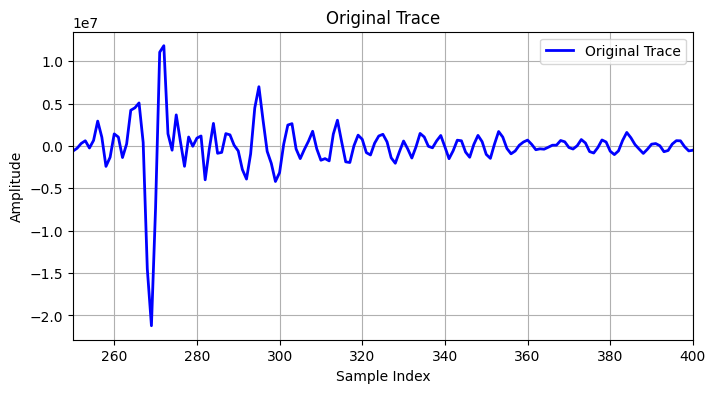

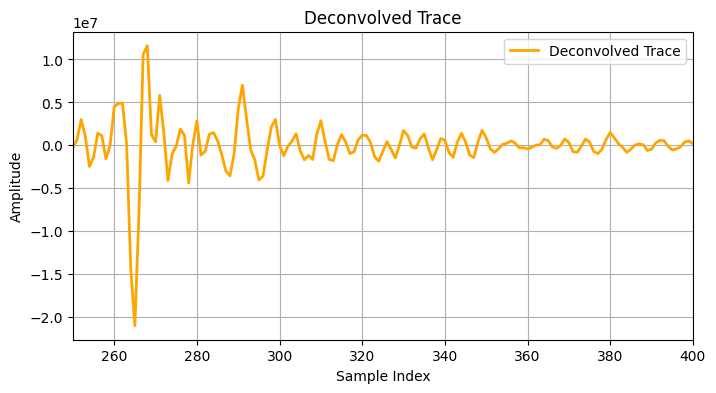

In [34]:
#getting the deconvolved trace (removing water layer reverberations)
deconvolved_trace = np.convolve(tr, operators, mode='same')

#plotting the original trace
plt.figure(figsize=(8, 4))
plt.plot(tr, label="Original Trace", linewidth=2, color='blue')
plt.title("Original Trace")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()
plt.xlim(250, 400)
plt.show()

#plotting the deconvovled trace
plt.figure(figsize=(8, 4))
plt.plot(deconvolved_trace, label="Deconvolved Trace", linewidth=2, color='orange')
plt.title("Deconvolved Trace")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()
plt.xlim(250, 400)
plt.show()

In [35]:
tr=deconvolved_trace
#calculating the autocorrelation
autocorr = np.correlate(tr, tr, mode='full')

#extracting only the relevant part (non-negative lags)
n = len(tr)
autocorr=autocorr/np.max(autocorr)
autocorr_positive = autocorr[n-1:]

n_filter = 4
alpha=5

#constructing the Toeplitz matrix
autocorr_matrix = toeplitz(autocorr_positive[:n_filter+alpha])

#getting the rhv
rhv = autocorr_matrix[0]

#building the rhv
rhv_concatenated = np.concatenate((rhv, [ 0, 0, 0, 0]))

#solving the system to get the operators
try:
    #extracting the submatrix and the right-hand side vector relevant for the size n
    autocorr_submatrix = autocorr_matrix[:n_filter, :n_filter]  #selecting only the first n rows and columns
    rhv_relevant = rhv_concatenated[:n_filter]  #selecting only the first n elements of the rhv vector
    #solving for the operators
    coefficients = np.linalg.solve(autocorr_submatrix, rhv_relevant)
    #showing the results
    print("Solution (coefficients):", coefficients)

except np.linalg.LinAlgError as e:
    print("Error solving the system:", e)

Solution (coefficients): [ 1.  0.  0. -0.]


In [36]:
initial_values = [1, 0, 0, 0, 0]

#append the operators with the vector to get the final desired vector
operators = np.concatenate((initial_values, -coefficients))  # Negate coefficients as shown in the matrix
operators

array([ 1.,  0.,  0.,  0.,  0., -1., -0., -0.,  0.])

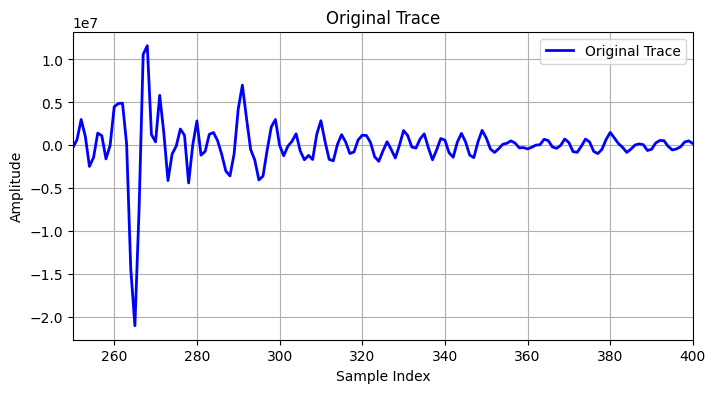

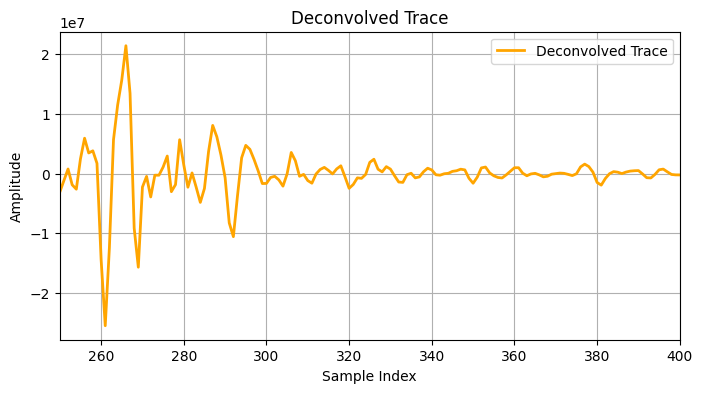

In [37]:
#getting the deconvolved trace (remove the airgun bubble effect)
deconvolved_trace2 = np.convolve(tr, operators, mode='same')

#plotting the original trace
plt.figure(figsize=(8, 4))
plt.plot(tr, label="Original Trace", linewidth=2, color='blue')
plt.title("Original Trace")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()
plt.xlim(250, 400)
plt.show()

#plotting the deconvovled trace
plt.figure(figsize=(8, 4))
plt.plot(deconvolved_trace2, label="Deconvolved Trace", linewidth=2, color='orange')
plt.title("Deconvolved Trace")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()
plt.xlim(250, 400)
plt.show()

In [38]:
pressure_traces = segyio.collect(f.trace[:240*4])[::4];

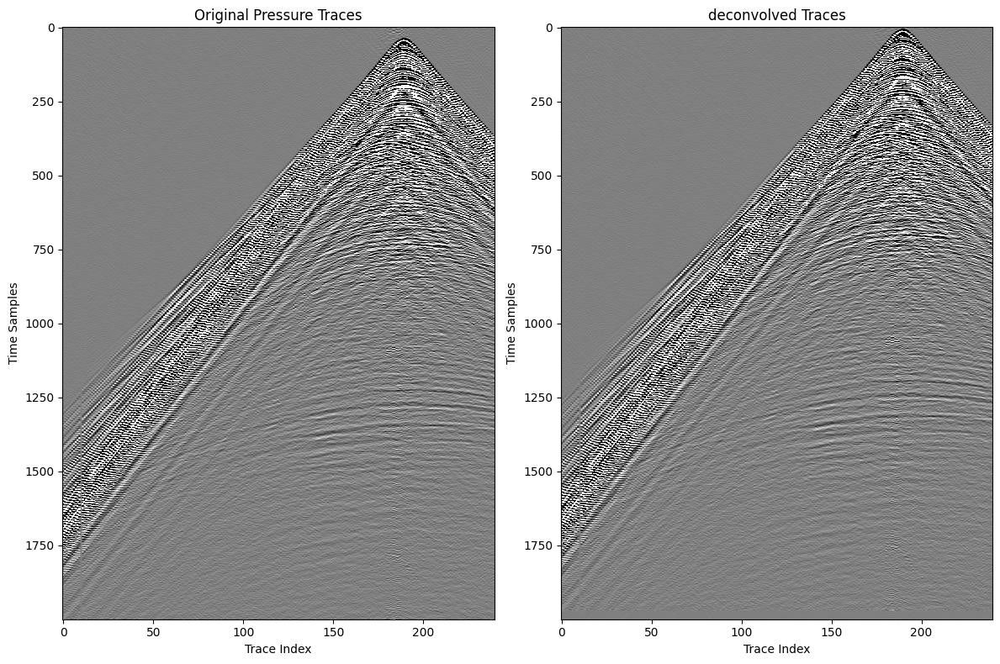

In [39]:
n = 4 #filter length
all_deconvolved_traces = []
#looping over all the traces and performing the steps
for tr in pressure_traces:
    autocorr = np.correlate(tr, tr, mode='full')
    lags = np.arange(-len(tr) + 1, len(tr))
    autocorr = autocorr / np.max(autocorr)
    alpha=60
    #cross-correlation between shifted trace and original trace
    shifted_tr = np.roll(tr, alpha)  # Shift the trace by alpha
    crosscorr = np.correlate(shifted_tr, tr, mode='full')
    crosscorr = crosscorr / np.max(crosscorr)
    crosscorr_positive = crosscorr[len(tr) - 1:len(tr) - 1 + alpha]  # Lags 0 to alpha-1

    #getting the autocorrelation matrix, toeplitz matrix, and the rhv correlation components
    autocorr = autocorr[len(tr) - 1:]
    autocorr = autocorr / np.max(autocorr)
    autocorr_matrix = toeplitz(autocorr[:n + alpha])

    #building the RHV vector
    rhv = np.concatenate((crosscorr_positive, np.zeros(n)))

    #solving for the operators
    try:
        autocorr_submatrix = autocorr_matrix[:n, :n]
        rhv_relevant = rhv[:n]
        coefficients = np.linalg.solve(autocorr_submatrix, rhv_relevant)
    except np.linalg.LinAlgError:
        coefficients = np.zeros(n)

    #getting the desired operator vector
    operators = np.concatenate(([1] + [0] * (alpha - 1), -coefficients))

    #getting the deconvolved trace
    deconvolved_trace = np.convolve(tr, operators, mode='same')
    all_deconvolved_traces.append(deconvolved_trace)

all_deconvolved_traces = np.array(all_deconvolved_traces)

plt.figure(figsize=(12, 8))
#plotting the original pressure traces
plt.subplot(1, 2, 1)
plt.imshow(pressure_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Original Pressure Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

#plotting the deconvolved traces
plt.subplot(1, 2, 2)
plt.imshow(all_deconvolved_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("deconvolved Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

plt.tight_layout()
plt.show()

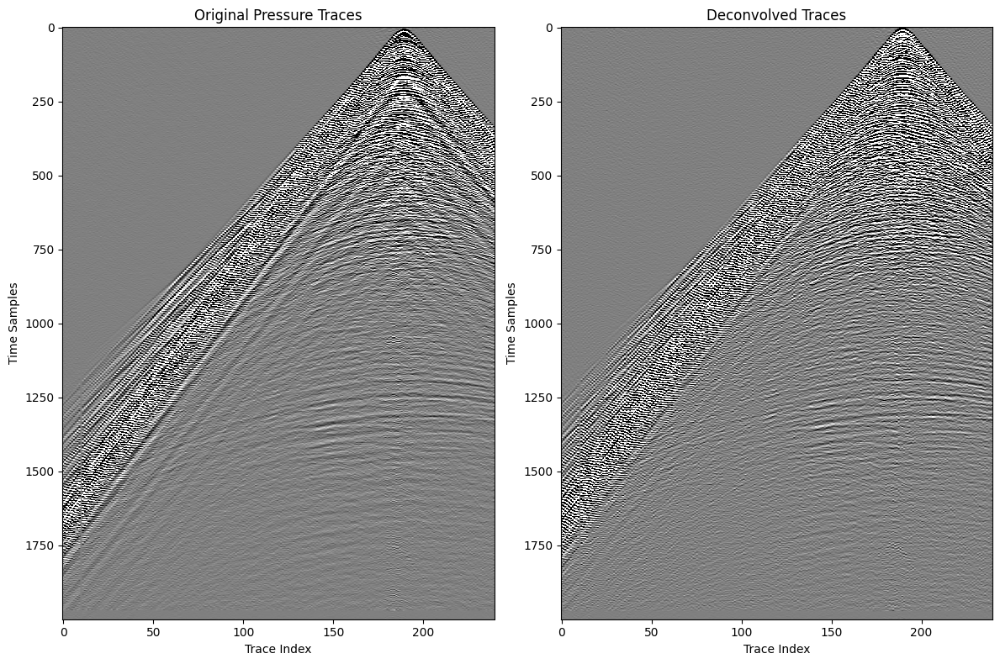

In [40]:
n = 4 # Filter length
all_deconvolved_traces2 = []
pressure_traces=all_deconvolved_traces;
#looping over all the traces and performing the steps
for tr in pressure_traces:
    #getting alpha
    autocorr = np.correlate(tr, tr, mode='full')
    lags = np.arange(-len(tr) + 1, len(tr))
    autocorr = autocorr / np.max(autocorr)
    positive_lags = lags[lags >= 0]
    positive_autocorr = autocorr[lags >= 0]
    zero_crossings = np.where(np.diff(np.sign(positive_autocorr)))[0]
    alpha = positive_lags[zero_crossings[1]]

    #getting the autocorrelation matrix, toeplitz matrix, and the rhv correlation components
    autocorr = autocorr[len(tr) - 1:]
    autocorr = autocorr / np.max(autocorr)
    autocorr_matrix = toeplitz(autocorr[:n + alpha])

    #building the RHV vector
    rhvv=autocorr[:alpha];
    rhv = np.concatenate((rhvv, np.zeros(n)))

    #solving for the operators
    try:
        autocorr_submatrix = autocorr_matrix[:n, :n]
        rhv_relevant = rhv[:n]
        coefficients = np.linalg.solve(autocorr_submatrix, rhv_relevant)
    except np.linalg.LinAlgError:
        coefficients = np.zeros(n)

    #getting the desired operator vector
    operators = np.concatenate(([1] + [0] * (alpha - 1), -coefficients))

    #getting the deconvolved trace
    convolved_trace = np.convolve(tr, operators, mode='same')
    all_deconvolved_traces2.append(convolved_trace)

all_deconvolved_traces2 = np.array(all_deconvolved_traces2)

plt.figure(figsize=(12, 8))
# Plotting the original pressure traces
plt.subplot(1, 2, 1)
plt.imshow(pressure_traces.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Original Pressure Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

# Plotting the deconvolved traces
plt.subplot(1, 2, 2)
plt.imshow(all_deconvolved_traces2.T, cmap="gray", aspect="auto", vmin=-1e5, vmax=1e5)
plt.axis("tight")
plt.title("Deconvolved Traces")
plt.xlabel("Trace Index")
plt.ylabel("Time Samples")

plt.tight_layout()
plt.show()